In [1]:
#Importation des bibliothèques
import os
import cv2
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, LSTM, Dense, Dropout, Flatten
from IPython.display import HTML
from base64 import b64encode
import os
import random

In [2]:
#transformation des videos source labelisées originale pour les videos et deepfake pour les videos truquées 

# Chemin vers le dossier contenant les vidéos originales et deepfakes
videos_data = "/Users/benothmane/Desktop/Projet IA/DEEP"
# Liste des classes (originales et deepfakes)
classes = ["original", "deepfake"]


In [3]:
# Chemin de sortie pour les images extraites
output_folder = "/Users/benothmane/Desktop/Projet IA/images"

# Création  de DataFrame pour stocker les chemins d'accès des videos et leurs étiquettes
video_data = {"videos": [], "label": []}

In [4]:
# Parcours de chaque classe
for class_name in classes:
    class_folder = os.path.join(videos_data, class_name)
    
    # Parcours de chaque vidéo dans la classe
    for video_file in os.listdir(class_folder):
        video_path = os.path.join(class_folder, video_file)
        
        # Ajout du chemin de la vidéo et label au DataFrame
        video_data["videos"].append(video_path)
        video_data["label"].append(class_name)


In [5]:
# Création du  DataFrame à partir des données vidéos
vds = pd.DataFrame(video_data)

# Sauvegarde du  DataFrame en  local en fichier CSV 
vds.to_csv("/Users/benothmane/Desktop/Projet IA/deepfake_data.csv", index=False)

In [6]:
vds.head()

,videos,label
0,/Users/benothmane/Desktop/Projet IA/DEEP/origi...,original
1,/Users/benothmane/Desktop/Projet IA/DEEP/origi...,original
2,/Users/benothmane/Desktop/Projet IA/DEEP/origi...,original
3,/Users/benothmane/Desktop/Projet IA/DEEP/origi...,original
4,/Users/benothmane/Desktop/Projet IA/DEEP/origi...,original


In [7]:
#importation du  fichier csv
videos_data = "/Users/benothmane/Desktop/Projet IA/deepfake_data.csv"
data_videos =  pd.read_csv(videos_data)


In [8]:
data_videos.head()

,videos,label
0,/Users/benothmane/Desktop/Projet IA/DEEP/origi...,original
1,/Users/benothmane/Desktop/Projet IA/DEEP/origi...,original
2,/Users/benothmane/Desktop/Projet IA/DEEP/origi...,original
3,/Users/benothmane/Desktop/Projet IA/DEEP/origi...,original
4,/Users/benothmane/Desktop/Projet IA/DEEP/origi...,original


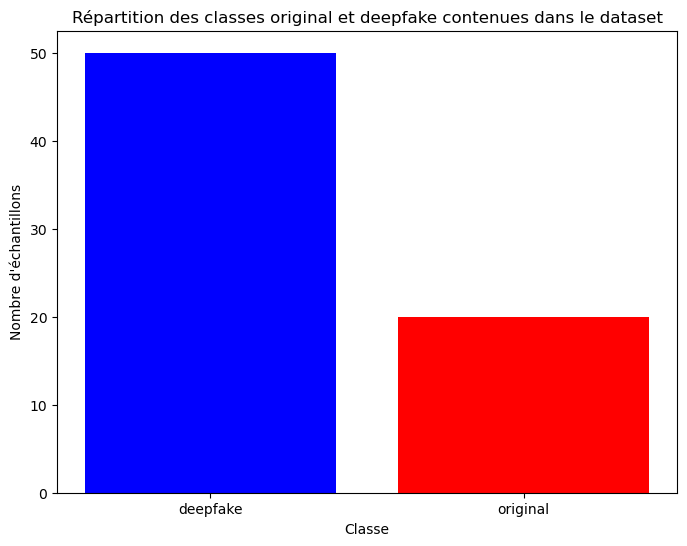

In [9]:
# Comptabilisation du Nombre d'échantillons pour chaque classe
class_counts = data_videos['label'].value_counts()

# Graphique à barres pour visualiser la répartition des classes
plt.figure(figsize=(8, 6))
plt.bar(class_counts.index, class_counts.values, color=['blue', 'red'])
plt.xlabel('Classe')
plt.ylabel('Nombre d\'échantillons')
plt.title('Répartition des classes original et deepfake contenues dans le dataset')
plt.show()

In [10]:
#dimensions du dataset
data_videos.shape

(70, 2)

In [11]:

# liste  de 3 vidéos deepfake selectionnées  de maniere aleatoire
deepfake_videos = data_videos[data_videos['label'] == 'deepfake']['videos'].sample(5).tolist()
#affichage
print("Liste de vidéos deepFake aléatoire :")
deepfake_videos

Liste de vidéos deepFake aléatoire :


['/Users/benothmane/Desktop/Projet IA/DEEP/deepfake/si911-video-mdbb0.mp4',
 "/Users/benothmane/Desktop/Projet IA/DEEP/deepfake/President Joe Biden's Magical Pistachio Story (Deepfake AI).mp4",
 '/Users/benothmane/Desktop/Projet IA/DEEP/deepfake/Ultra realistic Deepfake of Elon Musk.mp4',
 '/Users/benothmane/Desktop/Projet IA/DEEP/deepfake/si1400-video-fjwb0.avi',
 '/Users/benothmane/Desktop/Projet IA/DEEP/deepfake/sa2-video-mjsw0 2.mp4']

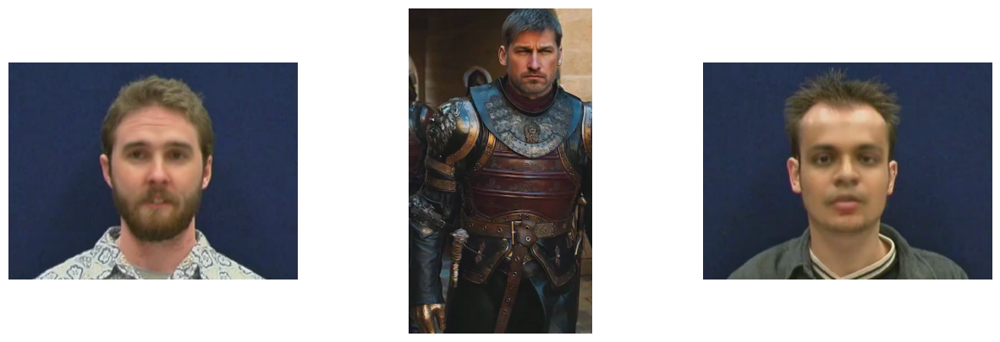

In [12]:
#Fonction pour réaliser une capture vidéo à partir de  vidéos deepfake ,lire l'image et afficher les images
def display_images_from_videos(video_paths):
    plt.figure(figsize=(15, 5))  
    num_videos = len(video_paths) 

    for i, video_path in enumerate(video_paths, start=1):
        plt.subplot(1, num_videos, i) 
        capture_image = cv2.VideoCapture(video_path) 
        ret, frame = capture_image.read()
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        plt.imshow(frame)
        plt.axis('off')
        capture_image.release()  

    plt.show()

# Chargement du dataset
data_videos = pd.read_csv("/Users/benothmane/Desktop/Projet IA/deepfake_data.csv")

# Sélection aléatoire de 3 vidéos DeepFake
fake_videos = data_videos[data_videos['label'] == 'deepfake']['videos'].sample(3).tolist()

# Affichage des  images extraites des vidéos DeepFake sélectionnées sur une seule ligne
display_images_from_videos(fake_videos)

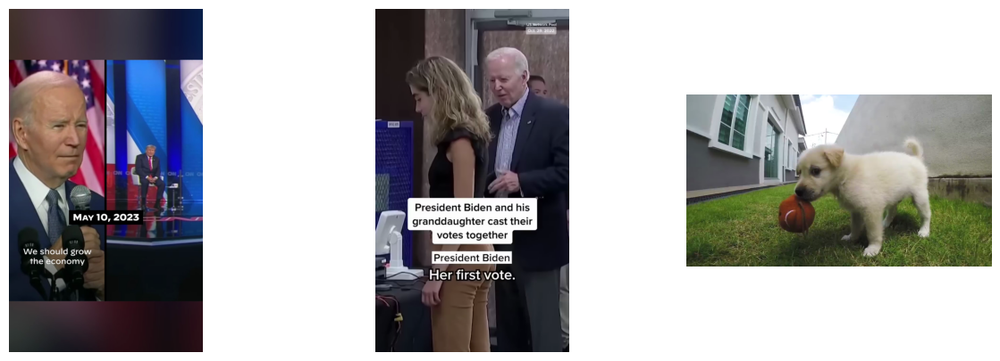

In [13]:
#Fonction pour réaliser une capture vidéo à partir de  vidéos originales ,lire l'image et afficher les images
def display_images_from_videos(video_paths):
    plt.figure(figsize=(15, 5))  
    num_videos = len(video_paths) 

    for i, video_path in enumerate(video_paths, start=1):
        plt.subplot(1, num_videos, i)  
        capture_image = cv2.VideoCapture(video_path) 
        ret, frame = capture_image.read()
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        plt.imshow(frame)
        plt.axis('off')
        capture_image.release() 

    plt.show()

# Chargement du dataset
original_videos = pd.read_csv("/Users/benothmane/Desktop/Projet IA/deepfake_data.csv")

# Sélection aléatoire de 3 vidéos originales
real_videos = data_videos[data_videos['label'] == 'original']['videos'].sample(3).tolist()

# Affichage des  images extraites des vidéos DeepFake sélectionnées sur une seule ligne
display_images_from_videos(real_videos)


In [14]:
fake_videos = list(data_videos.loc[data_videos.label == 'deepfake', 'videos']) 

In [15]:

# Fonction pour Afficher les vidéos deepfake 
def play_video(video_file, video_folder):
    
    video_path = os.path.join(video_folder, video_file)
    video_url = open(video_path, 'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(video_url).decode()
    return HTML("""<video width=500 controls><source src="%s" type="video/mp4"></video>""" % data_url)

# Chemin du dossier deepfake
deepfake_folder = "/Users/benothmane/Desktop/Projet IA/DEEP/deepfake"

# Liste  de fichiers vidéos dans le dossier deepfake
video_files = [f for f in os.listdir(deepfake_folder) if f.endswith(".mp4")]

# Sélection aléatoire de  3 vidéos
selected_videos = random.sample(video_files, 3)

# Affichage  des vidéos sélectionnées
html_content = ""
for video in selected_videos:
    html_content += play_video(video, deepfake_folder)._repr_html_()

display(HTML("<div style='display:flex; flex-direction:row;'>" + html_content + "</div>"))

In [16]:
# Fonction pour Afficher les vidéos originales
def play_video(video_file, video_folder):
    
    video_path = os.path.join(video_folder, video_file)
    video_url = open(video_path, 'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(video_url).decode()
    return HTML("""<video width=500 controls><source src="%s" type="video/mp4"></video>""" % data_url)

# Chemin du dossier original
original_folder = "/Users/benothmane/Desktop/Projet IA/DEEP/original"

# Liste des fichiers vidéo dans le dossier deepfake
video_files = [f for f in os.listdir(original_folder) if f.endswith(".mp4")]

# Sélection aléatoire de  3vidéos
selected_videos = random.sample(video_files, 3)
# Affichage des vidéos sélectionnées
html_content = ""
for video in selected_videos:
    html_content += play_video(video, original_folder)._repr_html_()

display(HTML("<div style='display:flex; flex-direction:row;'>" + html_content + "</div>"))

In [17]:
#fonction de prétraitement des données 
import pandas as pd
import cv2
import numpy as np
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
import os
def preprocess_data(data_dir, image_size=(100, 100)):
    X = []
    y = []
    
    for label, folder in enumerate(['original', 'deepfake']):
        folder_path = os.path.join(data_dir, folder)
        for video_file in os.listdir(folder_path):
            # Ignorer les fichiers .DS_Store
            if video_file.endswith('.DS_Store'):
                continue
            video_path = os.path.join(folder_path, video_file)
            cap = cv2.VideoCapture(video_path)
            while True:
                ret, frame = cap.read()
                if not ret:
                    break
                # Redimensionner l'image à une taille fixe
                frame_resized = cv2.resize(frame, image_size)
                X.append(frame_resized)
                y.append(label)
            cap.release()

    X = np.array(X)
    y = np.array(y)
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    X_train = X_train / 255.0
    X_test = X_test / 255.0
    
    return X_train, y_train, X_test, y_test

In [18]:
#Construction du modèle d'apprentissage profond CNN
def build_model(input_shape):
    model = keras.Sequential([
        keras.layers.lst(32, (3, 3), activation='relu', input_shape=input_shape),
 vation='relu'),
        keras.layers.MaxPooling2D((2, 2)),
        keras.layers.Flatten(),
        keras.layers.Dense(128, activation='relu'),
        keras.layers.Dense(1)
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

In [19]:
#Definition de la fonction principale pour implémenter la détection de DeepFake
from tensorflow.keras.models import save_model

def main():
    # Spécifiez le chemin du dossier contenant les vidéos
    data_dir = '/Users/benothmane/Desktop/Projet IA/DEEP'
    
    # Prétraitement  des données
    X_train, y_train, X_test, y_test = preprocess_data(data_dir)
    
    # Construction du modèle
    model = build_model(X_train[0].shape)
    
    # Entraînement du modèle
    model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test))
   
    # Évaluation du modèle
    loss, accuracy = model.evaluate(X_test, y_test)
    print("Accuracy on test data:", accuracy)
    
    # prédictions sur les données de du dataset  test
    predictions = model.predict(X_test)
    print("Predictions:", predictions)

    # Sauvegarde du  modèle
    save_model(model, '/Users/benothmane/Desktop/Projet IA/modele.h5')
#exécution 
if __name__ == '__main__':
    main()

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/10
671/671 ━━━━━━━━━━━━━━━━━━━━ 85s 125ms/step - accuracy: 0.9511 - loss: 0.1277 - val_accuracy: 0.9920 - val_loss: 0.0174
Epoch 2/10
671/671 ━━━━━━━━━━━━━━━━━━━━ 96s 144ms/step - accuracy: 0.9937 - loss: 0.0167 - val_accuracy: 0.9927 - val_loss: 0.0133
Epoch 3/10
671/671 ━━━━━━━━━━━━━━━━━━━━ 114s 170ms/step - accuracy: 0.9927 - loss: 0.0183 - val_accuracy: 0.9929 - val_loss: 0.0143
Epoch 4/10
671/671 ━━━━━━━━━━━━━━━━━━━━ 106s 158ms/step - accuracy: 0.9950 - loss: 0.0106 - val_accuracy: 0.9935 - val_loss: 0.0126
Epoch 5/10
671/671 ━━━━━━━━━━━━━━━━━━━━ 108s 161ms/step - accuracy: 0.9954 - loss: 0.0092 - val_accuracy: 0.9938 - val_loss: 0.0113
Epoch 6/10
671/671 ━━━━━━━━━━━━━━━━━━━━ 106s 157ms/step - accuracy: 0.9953 - loss: 0.0082 - val_accuracy: 0.9938 - val_loss: 0.0107
Epoch 7/10
671/671 ━━━━━━━━━━━━━━━━━━━━ 101s 150ms/step - accuracy: 0.9966 - loss: 0.0067 - val_accuracy: 0.9940 - val_loss: 0.0114
Epoch 8/10
671/671 ━━━━━━━━━━━━━━━━━━━━ 109s 162ms/step - accuracy: 0.9961 - l

Predictions: [[1.00000000e+00]
 [1.00000000e+00]
 [2.73686206e-32]
 ...
 [0.00000000e+00]
 [2.95204126e-37]
 [1.02954064e-32]]


In [20]:
#prediction sur une video quelconque pour  savoir si elle est originale ou deepfake
#fonction predict_video qui utilise un modèle d'apprentissage profond pré-entraîné pour détecter les DeepFakes dans une vidéo donnée.
import cv2
import numpy as np
from tensorflow.keras.models import load_model

# Fonction pour afficher une vidéo
def play_video(video_file, video_folder):
    video_path = os.path.join(video_folder, video_file)
    video_url = open(video_path, 'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(video_url).decode()
    return HTML("""<video width=500 controls><source src="%s" type="video/mp4"></video>""" % data_url)

def predict_video(video_path, model_path):
    cap = cv2.VideoCapture(video_path)
    predictions = []
    model = load_model(model_path) 

    while True:
        ret, frame = cap.read()
        if not ret:
            break
        
        frame_processed = cv2.resize(frame, (100, 100)) / 255.0
        prediction = model.predict(np.array([frame_processed]))
        predictions.append(prediction)

    cap.release()
    return "La vidéo est DeepFake." if np.mean(predictions) >= 0.5 else "La vidéo est originale."

video_path = input("Entrez le chemin de la vidéo : ")
model_path = input("Entrez le  modèle : ")

print(predict_video(video_path, model_path))
# Affichage de la vidéo
display(play_video(video_path, os.path.dirname(video_path)))

Entrez le chemin de la vidéo :  /Users/benothmane/Desktop/Projet IA/DEEP/deepfake/President Kennedy Discusses Rick and Morty copy.mp4
Entrez le  modèle :  /Users/benothmane/Desktop/Projet IA/modele.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


In [ ]:
#/Users/benothmane/Desktop/Projet IA/modele.h5 --chemin du modele